# REPORT
> This is an exploratory study on the **Benchmark Dataset**.

----------------
## Table of Contents

-**PART I**
1. Data Profiling
2. Data Preprocessing
3. Data Visualization

-**PART II**<br>
Machine Learning
1. Supervised Learning
2. Unsupervised Learning

# PART I

## 1. Data Profiling
Data profiling is concerned with summarizing your dataset through descriptive statistics. The goal of data profiling is to have a solid understanding of your data so you can afterwards start querying and visualizing your data in various ways. Depending on the result of the data profiling, you might decide to correct, discard or handle your data differently.

In [1]:
# Disable all warnings
import warnings
warnings.filterwarnings('ignore')

# Import libraries
import pandas as pd
import numpy as np
import itertools
from itertools import *
from IPython.display import *

In [2]:
# Import Benchmark Dataset
bm = pd.read_csv('benchmark_dialego.csv', sep = None)
bm.replace(to_replace='-', value=np.nan, inplace=True)

# Preview
bm.head(3)

,Project,Project no.,Month,Year,Client,Dialego product,Country,Language,Branche,Category,...,Personal Relevance of Benefit Scale,Understandability Base,Understandability Top Box,Understandability Top2 Box,Understandability Top3 Box,Understandability Top4 Box,Understandability Mean,Understandability Scale,VCM ratio,Unnamed: 100
0,871,3798,4,2013,Mars Research GmbH,AdExplore,UK,UK,FMCG,Pet Food,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,134,2491,1,2009,KPSS-Kao Professional Salon Services GmbH,ConceptFit,NL,NL,FMCG,Cosmetic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,NaN
2,231,1374,1,2004,Coca-Cola GmbH,NameFit,DE,DE,FMCG,Beverage non-alcoholic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Select relevant variables
bm = bm[['Concept type','Stimulus material','Year',
         'Country','Dialego product','Branche','Category','Brand Fit Mean','Brand Fit Scale',
         'Credibility Mean','Credibility Scale','Overall Liking Mean','Overall Liking Scale',
         'Personal Relevance Mean','Personal Relevance Scale',
         'Personal Relevance of Benefit Mean','Personal Relevance of Benefit Scale',
         'Purchase Intention Priced Mean','Purchase Intention Priced Scale',
         'Purchase Intention Unpriced Mean','Purchase Intention Unpriced Scale',
         'Understandability Mean','Understandability Scale','Uniqueness Mean','Uniqueness Scale',
         'Value for Money Mean','Value for Money Scale','Willingness to Try Mean','Willingness to Try Scale',
         'VCM ratio']]
bm.iloc[:,7:] = bm.iloc[:,7:].astype(float)

# Scale the KPIs: mean/scale
KPI = ['Brand Fit','Credibility','Overall Liking',
       'Personal Relevance','Personal Relevance of Benefit',
       'Purchase Intention Priced','Purchase Intention Unpriced',
       'Uniqueness','Understandability','Value for Money','Willingness to Try']
for i in KPI:
    bm[i] = bm[i + ' Mean']/bm[i + ' Scale']
bm = bm[['Concept type','Stimulus material','Year','Country','Dialego product','Branche','Category']
               + KPI + ['VCM ratio']]

bm.head(3)

,Concept type,Stimulus material,Year,Country,Dialego product,Branche,Category,Brand Fit,Credibility,Overall Liking,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
0,none,Visual,2013,UK,AdExplore,FMCG,Pet Food,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,new product,Visual + Verbal,2009,NL,ConceptFit,FMCG,Cosmetic,0.82,0.76,0.820000,0.7,NaN,0.58,0.76,0.68,NaN,0.62,NaN,0.5
2,new product,Verbal,2004,DE,NameFit,FMCG,Beverage non-alcoholic,NaN,NaN,0.514286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Replace inf with NaN values
bm.replace(to_replace=np.inf, value=np.nan, inplace=True)

In [5]:
# Data Statistics
bm.describe(include='all')

,Concept type,Stimulus material,Year,Country,Dialego product,Branche,Category,Brand Fit,Credibility,Overall Liking,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
count,7620,7620,7620.000000,7620,7620,7620,7620,3638.000000,2787.000000,6571.000000,2167.000000,850.000000,2658.000000,4844.000000,4053.000000,772.000000,1066.000000,742.000000,1699.000000
unique,7,7,NaN,21,19,12,45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,new product,Visual + Verbal,NaN,DE,ConceptFit,FMCG,Food,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3884,4343,NaN,5111,4345,6500,3627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,2008.388189,NaN,NaN,NaN,NaN,0.768762,0.702046,0.695481,0.632912,0.729069,0.629349,0.679861,0.652166,0.778385,0.631101,0.684284,0.399353
std,NaN,NaN,3.307723,NaN,NaN,NaN,NaN,0.104984,0.097200,0.104791,0.117300,0.097247,0.104943,0.104917,0.098924,0.110583,0.116207,0.138475,0.190791
min,NaN,NaN,2002.000000,NaN,NaN,NaN,NaN,0.350000,0.000000,0.000000,0.000000,0.300000,0.000000,0.000000,0.000000,0.300000,0.000000,0.000000,-0.400000
25%,NaN,NaN,2006.000000,NaN,NaN,NaN,NaN,0.720000,0.650000,0.650000,0.563333,0.683333,0.580000,0.620000,0.600000,0.740000,0.580000,0.640000,0.300000
50%,NaN,NaN,2009.000000,NaN,NaN,NaN,NaN,0.800000,0.716667,0.714286,0.640000,0.740000,0.640000,0.690909,0.660000,0.800000,0.660000,0.700000,0.400000
75%,NaN,NaN,2011.000000,NaN,NaN,NaN,NaN,0.840000,0.766667,0.766667,0.716667,0.800000,0.700000,0.740000,0.720000,0.857143,0.700000,0.766667,0.500000


In [6]:
bm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7620 entries, 0 to 7619
Data columns (total 19 columns):
Concept type                     7620 non-null object
Stimulus material                7620 non-null object
Year                             7620 non-null int64
Country                          7620 non-null object
Dialego product                  7620 non-null object
Branche                          7620 non-null object
Category                         7620 non-null object
Brand Fit                        3638 non-null float64
Credibility                      2787 non-null float64
Overall Liking                   6571 non-null float64
Personal Relevance               2167 non-null float64
Personal Relevance of Benefit    850 non-null float64
Purchase Intention Priced        2658 non-null float64
Purchase Intention Unpriced      4844 non-null float64
Uniqueness                       4053 non-null float64
Understandability                772 non-null float64
Value for Money        

In [7]:
# Class counts
for i in bm.iloc[:,:7].drop('Year', axis = 1).columns:
    display(pd.DataFrame(bm[i].value_counts()))

,Concept type
new product,3884
none,1183
new positioning,1149
line extension,510
available product,477
new packaging,312
relaunch,105


,Stimulus material
Visual + Verbal,4343
Visual,1951
Verbal,1144
Spot,91
Real Product,76
Visual / Spot,14
Sound,1


,Country
DE,5111
UK,701
FR,461
BE,203
AT,201
US,201
IT,191
ES,119
NL,92
CH,88


,Dialego product
ConceptFit,4345
PackageFit,1037
NameFit,631
ClaimCheck,410
AdExplore,367
RangeFit,322
BannerScreener,105
SpotExplore,96
TestimonialExplore,78
StoryboardExplore,65


,Branche
FMCG,6500
HAUS,448
PHAR,259
ITTK,96
VEME,74
FIDI,65
DUCG,52
RETL,40
SONS,37
EVU,30


,Category
Food,3627
Cosmetic,1614
Beverage non-alcoholic,623
Handcraft,276
OTC,249
Cleaning,208
Pharma,163
Beverage alcoholic,125
"White goods (Kitchen, WC)",86
Pet Food,75


## 2. Data Preprocessing
**Agenda:**

1. Data Imputation
2. Skewness
3. Missing Data

***Missing Data Imputation Algorithms:***<br>

1. **SimpleFill:** Replaces missing entries with the mean or median of each column.<br>

2. **KNN:** Nearest neighbor imputations which weights samples using the mean squared difference on features for which two rows both have observed data.<br>

3. **SoftImpute:** Matrix completion by iterative soft thresholding of SVD decompositions. Inspired by the softImpute package for R, which is based on Spectral Regularization Algorithms for Learning Large Incomplete Matrices by Mazumder et. al.<br>

4. **IterativeSVD:** Matrix completion by iterative low-rank SVD decomposition. Should be similar to SVDimpute from Missing value estimation methods for DNA microarrays by Troyanskaya et. al.<br>

5. **MICE:** Reimplementation of Multiple Imputation by Chained Equations.<br>

6. **MatrixFactorization:** Direct factorization of the incomplete matrix into low-rank U and V, with an L1 sparsity penalty on the elements of U and an L2 penalty on the elements of V. Solved by gradient descent.<br>

7. **NuclearNormMinimization:** Simple implementation of Exact Matrix Completion via Convex Optimization by Emmanuel Candes and Benjamin Recht using cvxpy. Too slow for large matrices.<br>

8. **BiScaler:** Iterative estimation of row/column means and standard deviations to get doubly normalized matrix. Not guaranteed to converge but works well in practice. Taken from Matrix Completion and Low-Rank SVD via Fast

In [8]:
from fancyimpute import *

# Data imputation: Create multiple imputed datasets
mice = pd.concat([bm.iloc[:,:7],pd.DataFrame(MICE().complete(np.matrix(bm.iloc[:,-12:])), columns=bm.iloc[:,-12:].columns)], axis=1)
knn = pd.concat([bm.iloc[:,:7],pd.DataFrame(KNN().complete(np.matrix(bm.iloc[:,-12:])), columns=bm.iloc[:,-12:].columns)], axis=1)
softimpute = pd.concat([bm.iloc[:,:7],pd.DataFrame(SoftImpute().complete(np.matrix(bm.iloc[:,-12:])), columns=bm.iloc[:,-12:].columns)], axis=1)
simplefill = pd.concat([bm.iloc[:,:7],pd.DataFrame(SimpleFill().complete(np.matrix(bm.iloc[:,-12:])), columns=bm.iloc[:,-12:].columns)], axis=1)
iterative = pd.concat([bm.iloc[:,:7],pd.DataFrame(IterativeSVD().complete(np.matrix(bm.iloc[:,-12:])), columns=bm.iloc[:,-12:].columns)], axis=1)

[MICE] Completing matrix with shape (7620, 12)
[MICE] Starting imputation round 1/110, elapsed time 0.008
[MICE] Starting imputation round 2/110, elapsed time 0.372
[MICE] Starting imputation round 3/110, elapsed time 0.636
[MICE] Starting imputation round 4/110, elapsed time 0.817
[MICE] Starting imputation round 5/110, elapsed time 1.114
[MICE] Starting imputation round 6/110, elapsed time 1.388
[MICE] Starting imputation round 7/110, elapsed time 1.638
[MICE] Starting imputation round 8/110, elapsed time 1.911
[MICE] Starting imputation round 9/110, elapsed time 2.132
[MICE] Starting imputation round 10/110, elapsed time 2.320
[MICE] Starting imputation round 11/110, elapsed time 2.543
[MICE] Starting imputation round 12/110, elapsed time 2.711
[MICE] Starting imputation round 13/110, elapsed time 2.915
[MICE] Starting imputation round 14/110, elapsed time 3.125
[MICE] Starting imputation round 15/110, elapsed time 3.239
[MICE] Starting imputation round 16/110, elapsed time 3.366
[M

Imputing row 2801/7620 with 11 missing, elapsed time: 32.347
Imputing row 2901/7620 with 10 missing, elapsed time: 32.397
Imputing row 3001/7620 with 5 missing, elapsed time: 32.446
Imputing row 3101/7620 with 11 missing, elapsed time: 32.506
Imputing row 3201/7620 with 8 missing, elapsed time: 32.565
Imputing row 3301/7620 with 8 missing, elapsed time: 32.622
Imputing row 3401/7620 with 6 missing, elapsed time: 32.673
Imputing row 3501/7620 with 10 missing, elapsed time: 32.718
Imputing row 3601/7620 with 5 missing, elapsed time: 32.773
Imputing row 3701/7620 with 6 missing, elapsed time: 32.826
Imputing row 3801/7620 with 2 missing, elapsed time: 32.883
Imputing row 3901/7620 with 4 missing, elapsed time: 32.937
Imputing row 4001/7620 with 5 missing, elapsed time: 32.997
Imputing row 4101/7620 with 9 missing, elapsed time: 33.055
Imputing row 4201/7620 with 5 missing, elapsed time: 33.113
Imputing row 4301/7620 with 10 missing, elapsed time: 33.169
Imputing row 4401/7620 with 5 missi

[SoftImpute] Stopped after iteration 100 for lambda=1.966209
[IterativeSVD] Iter 1: observed MAE=0.269885
[IterativeSVD] Iter 2: observed MAE=0.155657
[IterativeSVD] Iter 3: observed MAE=0.095237
[IterativeSVD] Iter 4: observed MAE=0.036686
[IterativeSVD] Iter 5: observed MAE=0.011699
[IterativeSVD] Iter 6: observed MAE=0.006974
[IterativeSVD] Iter 7: observed MAE=0.004701
[IterativeSVD] Iter 8: observed MAE=0.003467
[IterativeSVD] Iter 9: observed MAE=0.002727
[IterativeSVD] Iter 10: observed MAE=0.002246
[IterativeSVD] Iter 11: observed MAE=0.001916
[IterativeSVD] Iter 12: observed MAE=0.001678


In [9]:
# Import widgets
from ipywidgets import *
import ipywidgets as widgets
from IPython.display import *
from scipy.stats import *

In [10]:
# Data Statistic for available datasets so far
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def f(Dataset):
    display(my_dict[Dataset].head(10))
    display(my_dict[Dataset].describe(include = 'all'))
interactive(f, Dataset=[a,b,c,d,e,f])

In [11]:
# Skewness inspection
def g(Dataset):
    display(pd.DataFrame(my_dict[Dataset].drop('Year', axis=1).skew(), columns = ['Skewness']))
interactive(g, Dataset=[a,b,c,d,e,f])

In [12]:
# Skewness correction: for any abs value > 3.
for i in [bm,mice,knn,softimpute,iterative,simplefill]:
    for j in i.iloc[:,-12:].columns:
        if abs(i[j].skew()) > 3.:
            i[j].replace(i[j].tolist(), np.log1p(i[j]).tolist(), inplace=True)
        else:
            None
interactive(g, Dataset=[a,b,c,d,e,f])

In [13]:
# Missing Data
# Import library
import missingno as msno
import matplotlib.pyplot as plt
%matplotlib inline

In [14]:
def k(Plot):
    if Plot == 'Matrix':
        print('Missing Data: Matrix Plot')
        msno.matrix(bm, sparkline=False)
    elif Plot == 'Dendogram':
        print('Missing Data: Dendogram')
        msno.dendrogram(bm)
        print("To interpret this graph, read it from a top-down perspective. Cluster leaves which linked together at a distance of zero fully predict one another's presence—one variable might always be empty when another is filled, or they might always both be filled or both empty, and so on.")
    else:
        print('Missing Data: Barplot')
        msno.bar(bm)
    plt.show()
#    plt.savefig('Missing Data Plot - {}.png'.format(Plot))
interactive(k, Plot = ['Matrix', 'Dendogram', 'Bar'])

## 3. Data Visualization
**Agenda:**

1. Boxplots
2. Density Plots
3. Violin Plots
4. Distplots
5. Categorical Statistics Plots
6. Heatmaps
7. Countplots (for categorical variables)
8. Jointplots
9. Pie Charts
10. Timeseries Charts
11. Histograms

In [15]:
# Import libraries
import seaborn as sns
import matplotlib.mlab as mlab
import plotly
plotly.tools.set_credentials_file(username='toanh260196', api_key='FUKLqeBXMXLbzJyLA7sr')
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.graph_objs import *
import plotly.figure_factory as ff
import plotly.tools as tls
import cufflinks as cf
from plotly.offline import *
init_notebook_mode()
cf.set_config_file(offline=True, world_readable=True, theme='ggplot')

### 3.1 Boxplots

In [16]:
list1 = bm.iloc[:,-12:].columns.tolist()
list1.extend(['All KPIs'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def boxplot(Dataset, KPI, Style):
    if Style == 'Plotly':
        if KPI == 'All KPIs':
            my_dict[Dataset].iloc[:,-12:].iplot(kind = 'box', title = 'KPI Boxplots')
        else:
            my_dict[Dataset][KPI].iplot(kind = 'box', title = 'Boxplot of {}'.format(KPI))
    else:
        if KPI == 'All KPIs':
            plt.figure(figsize=(12,8))
            sns.boxplot(my_dict[Dataset].iloc[:,-12:])
            plt.xticks(rotation = 90)
            plt.title('KPI Boxplots' + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
            plt.tight_layout()
            plt.show()
        else:
            plt.figure(figsize = (4,6))
            sns.boxplot(y = my_dict[Dataset][KPI])
            plt.title('Boxplot of {}'.format(KPI) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
            plt.tight_layout()
            plt.show()
interactive(boxplot, Dataset = [a,b,c,d,e,f],KPI = list1, Style = ['Plotly','Seaborn'])

### 3.2 Density Plots

In [17]:
list1 = bm.iloc[:,-12:].columns.tolist()
list1.extend(['All KPIs'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def density(Dataset, KPI, Style):
    if Dataset == a:
        if Style == 'Plotly':
            if KPI == 'All KPIs':
                data = pd.concat([my_dict[Dataset][['Year','Concept type']],my_dict[Dataset].iloc[:,-12:]],axis=1).groupby('Year').count()
                data=data.rename(columns = {'Concept type':'Full count'})
                data.iplot(title = 'Density Plot')
            else:
                data = my_dict[Dataset][['Year','Concept type',KPI]].groupby('Year').count()
                data.columns = ['Full count', KPI]
                data.iplot(kind='bar', title = 'Density Plot of {}'.format(KPI))
        else:
            if KPI == 'All KPIs':
                fig, ax = plt.subplots(figsize = (16,6))
                data = pd.concat([my_dict[Dataset][['Year','Concept type']],my_dict[Dataset].iloc[:,-12:]],axis=1).groupby('Year').count()
                data=data.rename(columns = {'Concept type':'Full count'})
                sns.set(style="white", palette="muted", color_codes=False)
                ax.plot(data)
                ax.legend(data.columns, loc = (1.02,0.2))
                plt.xlabel('Year')
                plt.ylabel('Count')
                plt.title('Density plot' + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
                plt.show()
            else:
                data = my_dict[Dataset][['Year','Concept type',KPI]].groupby('Year').count().reset_index()
                data.columns = ['Year','Full count', KPI]

                # Initialize the matplotlib figure
                f, ax = plt.subplots(figsize = (10,5))

                # Plot the total count
                sns.set_color_codes("pastel")
                sns.barplot(y="Full count", x="Year", data=data,
                        label="Full count", color="b")

                # Plot the actual KPI count
                sns.set_color_codes("muted")
                sns.barplot(y=KPI, x="Year", data=data,
                    label=KPI, color="b")
                plt.tight_layout()

                # Add a legend and informative axis label
                ax.legend(frameon=True)
                ax.set(ylabel="Count", xlabel="Year")
                plt.xticks(rotation = 90)
                plt.title('Density Plot of {}'.format(KPI) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
            
                plt.show()
    else:
        print('No data is missing since missing data has been imputed.')
interactive(density, Dataset = [a,b,c,d,e,f],KPI = list1, Style = ['Plotly','Seaborn'])

### 3.3 Violin Plots

In [18]:
list1 = bm.iloc[:,-12:].columns.tolist()
list1.extend(['All KPIs'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def violinplot(Dataset, KPI):
    if KPI == 'All KPIs':
        sns.set(style="whitegrid", palette="pastel", color_codes=True)
        plt.figure(figsize=(20,8))
        sns.violinplot(my_dict[Dataset].iloc[:,-12:])
        sns.despine(left=True)
        plt.xticks(rotation = 90, fontsize = 15)
        plt.title('KPI Violin Plots' + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 20)
        plt.tight_layout()
        plt.show()
    else:
        sns.set(style="whitegrid", palette="pastel", color_codes=True)
        plt.figure(figsize = (6,6))
        sns.violinplot(y = KPI, data = my_dict[Dataset])
        sns.despine(left=True)
        plt.title('Violin Plot of {}'.format(KPI) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
        plt.tight_layout()
        plt.show()
interactive(violinplot, Dataset = [a,b,c,d,e,f],KPI = list1)

### 3.4 Distplots

In [19]:
list1 = bm.iloc[:,-12:].columns.tolist()
list1.extend(['All KPIs'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def distplot(Dataset, KPI):
    if KPI == 'All KPIs':
        fig,axn = plt.subplots(3,4, sharey = True, figsize = (15,10))
        sns.set_style('darkgrid')
        for i, ax in enumerate(axn.flat):
            sns.distplot(my_dict[Dataset].iloc[:,-12:].iloc[:,i].dropna(), fit = norm, ax=ax)
            ax.legend(['Norm','Data'])
            fig.suptitle('KPI Distplots' + '\n' + 'Dataset: {}'.format(Dataset), x = 0.5, y = 1.03, fontsize = 15)
            plt.tight_layout()
        plt.show()
    else:
        sns.set_style('darkgrid')
        plt.figure(figsize=(8,6))
        sns.distplot(my_dict[Dataset][KPI].dropna(), fit = norm)
        plt.legend(['Normal Distribution','Data'])
        plt.title('Distplot of {}'.format(KPI) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
        plt.tight_layout()
        plt.show()
interactive(distplot, Dataset = [a,b,c,d,e,f],KPI = list1)

### 3.5 Categorical Statistics Plots

In [20]:
list1 = bm.iloc[:,-12:].columns.tolist()
list1.extend(['All KPIs'])
list2 = bm.iloc[:,:7].drop('Year',axis=1).columns.tolist()
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def category(Dataset, Category, KPI, Plot):
    if Plot == 'Barplot':
        if KPI == 'All KPIs':
            sns.set_style('white')
            fig,axn = plt.subplots(4,3, figsize = (30,15))
            fig.suptitle('Barplots of KPIs across {}'.format(Category) + '\n' + 'Dataset: {}'.format(Dataset), x = 0.5, y = 0.9, fontsize=15)
            for i,ax in enumerate(axn.flat):
                sns.barplot(y = list1[i], x = Category, data = my_dict[Dataset][[Category,list1[i]]].dropna(), ax=ax)
            plt.show()
        else:
            plt.figure(figsize=(15,6))
            sns.barplot(y = KPI, x = Category, data = my_dict[Dataset])
            plt.title('Mean {x} per {y}'.format(x = KPI, y = Category) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
            plt.xticks(rotation = 90)
            plt.show()

    else:
        if KPI == 'All KPIs':
            sns.set_style('white')
            fig,axn = plt.subplots(4,3, figsize = (30,15))
            fig.suptitle('Barplots of KPIs across {}'.format(Category) + '\n' + 'Dataset: {}'.format(Dataset), x = 0.5, y = 1.02, fontsize=15)
            for i,ax in enumerate(axn.flat):
                sns.boxplot(y = list1[i], x = Category, data = my_dict[Dataset][[Category,list1[i]]].dropna(), ax=ax)
                for tick in ax.get_xticklabels():
                    tick.set_rotation(90)
            plt.tight_layout()
            plt.show()
        else:
            plt.figure(figsize=(15,6))
            sns.boxplot(y = KPI, x = Category, data = my_dict[Dataset])
            plt.title('Mean {x} per {y}'.format(x = KPI, y = Category) + '\n' + 'Dataset: {}'.format(Dataset), fontsize = 15)
            plt.show()    
interactive(category, Dataset = [a,b,c,d,e,f], KPI = list1,
           Category = list2, Plot= ['Barplot','Boxplot'])

### 3.6 Heatmaps

In [21]:
#list1 = bm.iloc[:,-12:].columns.tolist()
#list1.extend(['All KPIs'])
list2 = bm.iloc[:,:7].drop('Year',axis=1).columns.tolist()
list2.extend(['No group'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def heatmap(Dataset, Category):
    if Category == 'No group':
        plt.figure(figsize=(10,8))
        sns.heatmap(my_dict[Dataset].drop('Year', axis = 1).corr(), cmap = 'coolwarm', vmin = -1, vmax = 1, annot=True)
        plt.title('Pearson Correlation'.format(Category) + '\n' + 'Dataset: {}'.format(Dataset),
             fontsize = 15)
        plt.tight_layout()
        plt.show()
    else:
        # Correlation table
        corr = []
        pairs = []
        for i in itertools.combinations(my_dict[Dataset].columns.tolist()[-12:],2):
            corr.append(my_dict[Dataset][[Category,i[0],i[1]]].dropna().groupby(Category).mean().corr().values[0][1])
            pairs.append(list(i))
        corr_pd = pd.DataFrame(data = [pairs,corr], index = ['Corr Pair','Corr']).transpose()
    
        # Iterators
        lista = np.arange(66)
        listb = []
        for i in np.arange(1,12):
            listb.extend(list(np.arange(i,12)))
        listc = []
        for i, j in itertools.zip_longest(list(reversed(np.arange(0,12))),list(np.arange(12))):
            listc.extend([j]*i)
    
        # Correlation matrix
        test = pd.DataFrame(index = my_dict[Dataset].columns.tolist()[-12:],
                        columns = my_dict[Dataset].columns.tolist()[-12:],
                   data = np.nan)
        for x,y,z in itertools.zip_longest(lista, listb, listc):
            test.iloc[y,z] = corr_pd['Corr'][x]
    
        # Heatmap
        plt.figure(figsize=(10,8))
        sns.heatmap(test, cmap = 'coolwarm', vmin = -1, vmax = 1, annot=True, annot_kws = {'fontsize' : 12})
        plt.title('Pearson Correlation (Grouped by {})'.format(Category) + '\n' + 'Dataset: {}'.format(Dataset),
                 fontsize = 15, y = 1.02)
        plt.tight_layout()
        plt.show()
interactive(heatmap, Dataset = [a,b,c,d,e,f], Category = list2)

In [22]:
list2 = bm.iloc[:,:7].drop('Year',axis=1).columns.tolist()
#list2.extend(['No group'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

x_widget = Dropdown(options = list2)
y_widget = Dropdown()

def update(*args):
    y_widget.options = bm[x_widget.value].unique().tolist()
x_widget.observe(update)

def class_heatmap(Dataset, Category, Class):
    plt.figure(figsize=(10,8))
    sns.heatmap(my_dict[Dataset][my_dict[Dataset][Category] == Class].drop('Year', axis = 1).corr(),
               cmap = 'coolwarm', vmax = 1, vmin = -1, annot = True, annot_kws = {'fontsize' : 12})
    plt.title('Class: {}'.format(Class)
              + '\n'
              + 'Category: {}'.format(Category)
              + '\n'
              + 'Number of data points: {}'.format(my_dict[Dataset][my_dict[Dataset][Category] == Class].drop('Year', axis = 1).shape[0])
              + '\n'
              + 'Dataset: {}'.format(Dataset), fontsize = 15, y = 1.02)
    plt.tight_layout()
    plt.show()

#interactive(class_heatmap, Dataset = [a,b,c,d,e,f], Category = list2, Class = bm[lambda x: Category].unique())

interact(class_heatmap,
         Dataset = [a,b,c,d,e,f],
         Category= x_widget,
         Class= y_widget);

### 3.7 Countplots

In [23]:
list2 = bm.iloc[:,:7].drop('Year',axis=1).columns.tolist()
#list2.extend(['No group'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative       

def count_category(Dataset, Category, Plot):
    if Plot == 'Countplot':
        fig, ax = plt.subplots(figsize=(15,8))
        sns.countplot(x = Category, data = my_dict[Dataset], ax=ax)
        for p in ax.patches:
            ax.annotate(int(np.round(p.get_height(),decimals=2)), (p.get_x()+p.get_width()/2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')
        plt.title('Countplot of {}'.format(Category)
              + '\n'
              + 'Dataset: {}'.format(Dataset), fontsize=15)
        plt.xticks(rotation = 90)
        plt.tight_layout()
        plt.show()
    else:
        fig, ax = plt.subplots(figsize=(30,10))
        sns.stripplot(x = Category, y = 'Year', jitter = True, data = my_dict[Dataset], ax=ax, size = 3)
        plt.title('Stripplot of {}'.format(Category)
              + '\n'
              + 'Dataset: {}'.format(Dataset), fontsize=15)
        plt.xticks(rotation = 90)
        plt.tight_layout()
        plt.show()
interactive(count_category, Dataset = [a,b,c,d,e,f], Category = list2, Plot = ['Countplot','Stripplot'])

### 3.8 Jointplots

In [24]:
list1 = bm.iloc[:,-12:].columns.tolist()
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative

def joint(Dataset, KPI1, KPI2, Plot):
    plt.figure()
    sns.set(style = 'darkgrid', color_codes=True)
    sns.jointplot(KPI1, KPI2, data=my_dict[Dataset], kind=Plot, size = 8)
    plt.tight_layout()
    plt.show()
interactive(joint, Dataset = [a,b,c,d,e,f], KPI1 = list1,
          KPI2 = list1, Plot = ["scatter", "reg", "resid", "kde", "hex"])

### 3.9 Pie Charts

In [25]:
list2 = bm.iloc[:,:7].drop('Year',axis=1).columns.tolist()
#list2.extend(['No group'])
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative  

def pie_chart(Dataset, Category, Style):
    if Style == 'Matplotlib':
        labels = pd.DataFrame(my_dict[Dataset][Category]).reset_index().groupby(Category).count().index.tolist()
        sizes = pd.DataFrame(my_dict[Dataset][Category]).reset_index().groupby(Category).count()['index'].tolist()
        plt.figure()
        patches, texts = plt.pie(sizes, shadow=True, startangle=90,
                         colors = plt.cm.tab20b(np.linspace(0, 1, len(my_dict[Dataset][Category].unique().tolist()))))
        plt.legend(patches, labels, loc=7, bbox_to_anchor=(1.1, 0.5),
               frameon = True, fancybox = True, title = 'Classes',
          facecolor = 'w', edgecolor = 'black', shadow = True)
        plt.title('Pie Chart' + '\n' + 'Category: {}'.format(Category)
                  + '\n' + 'Dataset: {}'.format(Dataset), size = 15)
        plt.tight_layout()
        plt.axis('equal')
        plt.show()
    else:
        pd.DataFrame(my_dict[Dataset][Category]).reset_index().groupby(Category).count().reset_index().iplot(kind='pie',labels=Category,values='index',
                                                                                                             title = 'Pie Chart (Category: {})'.format(Category))
interactive(pie_chart, Dataset = [a,b,c,d,e,f],
           Category = list2,
           Style = ['Matplotlib','Plotly'])

### 3.10 Timeseries Chart

In [26]:
import re
import math
from bokeh.palettes import *
from bokeh.plotting import *

In [27]:
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative  

def mean_KPI_over_time(Dataset):
    output_notebook()

    bokeh_data = []
    for i in bm.iloc[:,-12:].columns.tolist():
        bokeh_data.append(my_dict[Dataset][['Year',i]].groupby('Year').mean().reset_index())

    p = Figure(plot_width = 800, plot_height = 500)
    p.title.text = ('Click on legend entries to hide the corresponding lines.')
    p.title.text_font_style = "italic"

    for data, name, color in zip(bokeh_data, my_dict[Dataset].iloc[:,-12:].columns.tolist(), Category20_12):
                   df = data
                   p.line(df['Year'], df.iloc[:,1], line_width = 2,
                         color = color,
                         alpha = 0.8,
                         legend = name)
    p.legend.location = 'top_left'
    p.legend.click_policy = 'hide'
    p.legend.background_fill_alpha = 0.3
    p.legend.inactive_fill_alpha = 0.5
    p.legend.label_text_font_size = '8pt'
    
    show(p)

interactive(mean_KPI_over_time, Dataset = [a,b,c,d,e,f])

### 3.11 Histograms

In [28]:
my_dict = {}
a,b,c,d,e,f = ['Original data','MICE-imputed data','KNN-imputed data',
               'SoftImpute-imputed data','SimpleFill-imputed data','IterativeSVD-imputed data']
my_dict[a] = bm
my_dict[b] = mice
my_dict[c] = knn
my_dict[d] = softimpute
my_dict[e] = simplefill
my_dict[f] = iterative  

def hist(Dataset):
    my_dict[Dataset].hist(bins=50, figsize=(20,15))
    plt.show()
interactive(hist,
           Dataset = [a,b,c,d,e,f])

# PART II

> Machine Learning

In [29]:
# Make copies of our datasets
# We'll perform preprocessing & machine learning on these copies
bm2 = bm.copy()
mice2 = mice.copy()
knn2 = knn.copy()
softimpute2 = softimpute.copy()
simplefill2 = simplefill.copy()
iterative2 = iterative.copy()

In [30]:
# To make this notebook's output identical at every run
np.random.seed(42)

In [31]:
bm2.head()

,Concept type,Stimulus material,Year,Country,Dialego product,Branche,Category,Brand Fit,Credibility,Overall Liking,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
0,none,Visual,2013,UK,AdExplore,FMCG,Pet Food,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,new product,Visual + Verbal,2009,NL,ConceptFit,FMCG,Cosmetic,0.82,0.76,0.820000,0.70,NaN,0.58,0.76,0.68,NaN,0.62,NaN,0.5
2,new product,Verbal,2004,DE,NameFit,FMCG,Beverage non-alcoholic,NaN,NaN,0.514286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,new positioning,Visual + Verbal,2005,AT,RangeFit,FMCG,Food,NaN,NaN,0.366667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,none,Verbal,2008,SK,ConceptFit,HAUS,White Goods,0.70,0.64,0.660000,0.62,NaN,NaN,0.64,0.58,NaN,NaN,NaN,NaN


## 1. Supervised Learning

> Demo on bm2 first

### Create a Test Set

In [32]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(bm2, test_size=0.2, random_state=42)
train_set.shape, test_set.shape

((6096, 19), (1524, 19))

In [33]:
benchmark = train_set.drop('Overall Liking',axis = 1)
benchmark_labels = train_set['Overall Liking'].copy()
benchmark.head()

,Concept type,Stimulus material,Year,Country,Dialego product,Branche,Category,Brand Fit,Credibility,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
4056,new positioning,Visual + Verbal,2005,DE,AdExplore,FMCG,Food,NaN,NaN,NaN,NaN,0.633333,NaN,NaN,NaN,NaN,NaN,NaN
3012,new positioning,Visual + Verbal,2004,DE,ConceptFit,FMCG,Beverage alcoholic,0.460000,NaN,NaN,NaN,NaN,0.48,0.46,NaN,NaN,NaN,NaN
6208,new product,Visual + Verbal,2012,AT,ConceptFit,FMCG,Food,NaN,NaN,0.54,NaN,0.620000,NaN,0.60,NaN,NaN,NaN,NaN
5168,new positioning,Visual + Verbal,2009,DE,BannerScreener,FMCG,Pet Food,0.866667,NaN,NaN,NaN,NaN,0.65,NaN,NaN,NaN,NaN,0.5
4912,new product,Visual + Verbal,2004,UK,ConceptFit,FMCG,Cosmetic,NaN,0.64,NaN,NaN,0.740000,0.74,0.70,NaN,0.74,NaN,NaN


### Data Cleaning

In [34]:
from sklearn.preprocessing import Imputer
imputer = Imputer(strategy = 'median')

In [35]:
benchmark_num = benchmark.iloc[:,-11:]
benchmark_num.head()

,Brand Fit,Credibility,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
4056,NaN,NaN,NaN,NaN,0.633333,NaN,NaN,NaN,NaN,NaN,NaN
3012,0.460000,NaN,NaN,NaN,NaN,0.48,0.46,NaN,NaN,NaN,NaN
6208,NaN,NaN,0.54,NaN,0.620000,NaN,0.60,NaN,NaN,NaN,NaN
5168,0.866667,NaN,NaN,NaN,NaN,0.65,NaN,NaN,NaN,NaN,0.5
4912,NaN,0.64,NaN,NaN,0.740000,0.74,0.70,NaN,0.74,NaN,NaN


In [36]:
imputer.fit(benchmark_num)
imputer.statistics_

array([ 0.8       ,  0.71666667,  0.64      ,  0.74      ,  0.64      ,
        0.7       ,  0.66      ,  0.81428571,  0.66      ,  0.7       ,
        0.4       ])

In [37]:
X = imputer.transform(benchmark_num)
benchmark_tr = pd.DataFrame(X, columns = benchmark_num.columns)
benchmark_tr.head()

,Brand Fit,Credibility,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
0,0.800000,0.716667,0.64,0.74,0.633333,0.70,0.66,0.814286,0.66,0.7,0.4
1,0.460000,0.716667,0.64,0.74,0.640000,0.48,0.46,0.814286,0.66,0.7,0.4
2,0.800000,0.716667,0.54,0.74,0.620000,0.70,0.60,0.814286,0.66,0.7,0.4
3,0.866667,0.716667,0.64,0.74,0.640000,0.65,0.66,0.814286,0.66,0.7,0.5
4,0.800000,0.640000,0.64,0.74,0.740000,0.74,0.70,0.814286,0.74,0.7,0.4


### Handling Text and Categorical Attributes

In [38]:
benchmark_cat = benchmark.iloc[:,:7].drop('Year', axis = 1).copy()
benchmark_cat.head()

,Concept type,Stimulus material,Country,Dialego product,Branche,Category
4056,new positioning,Visual + Verbal,DE,AdExplore,FMCG,Food
3012,new positioning,Visual + Verbal,DE,ConceptFit,FMCG,Beverage alcoholic
6208,new product,Visual + Verbal,AT,ConceptFit,FMCG,Food
5168,new positioning,Visual + Verbal,DE,BannerScreener,FMCG,Pet Food
4912,new product,Visual + Verbal,UK,ConceptFit,FMCG,Cosmetic


In [39]:
benchmark_cat = pd.get_dummies(benchmark_cat)
benchmark_cat.head()

,Concept type_available product,Concept type_line extension,Concept type_new packaging,Concept type_new positioning,Concept type_new product,Concept type_none,Concept type_relaunch,Stimulus material_Real Product,Stimulus material_Spot,Stimulus material_Verbal,...,Category_Sonstige,Category_Sonstiges,Category_Sportevents,Category_TOUR,Category_Television/internet,Category_Textile,Category_Verlag,Category_Websites,Category_White Goods,"Category_White goods (Kitchen, WC)"
4056,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3012,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6208,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5168,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4912,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Feature Scaling & Tranformation Pipelines

In [40]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

num_pipeline = Pipeline([
        ('imputer', Imputer(strategy="median")),
        ('std_scaler', StandardScaler()),
    ])

benchmark_num_tr = num_pipeline.fit_transform(benchmark_num)
benchmark_num_tr.shape

(6096, 11)

### Select and Train a Model

In [41]:
from sklearn.linear_model import LinearRegression
benchmark_labels.fillna(benchmark_labels.median(), inplace = True)
lin_reg = LinearRegression()
lin_reg.fit(benchmark_num_tr, benchmark_labels)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [42]:
from sklearn.metrics import mean_squared_error

benchmark_predictions = lin_reg.predict(benchmark_num_tr)
lin_mse = mean_squared_error(benchmark_labels, benchmark_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

0.077518641386184597

In [43]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(benchmark_num_tr, benchmark_labels)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, presort=False, random_state=None,
           splitter='best')

In [44]:
benchmark_predictions = tree_reg.predict(benchmark_num_tr)
tree_mse = mean_squared_error(benchmark_labels, benchmark_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

0.054108031749749506

### Better Evaluation Using Cross-Validation

In [45]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(tree_reg, benchmark_num_tr, benchmark_labels,
                         scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-scores)

def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(tree_rmse_scores)

Scores: [ 0.0724452   0.06287442  0.08078484  0.07515597  0.07691019  0.07750441
  0.08346078  0.07140199  0.07018172  0.07598219]
Mean: 0.0746701709011
Standard deviation: 0.00551896293552


In [46]:
lin_scores = cross_val_score(lin_reg, benchmark_num_tr, benchmark_labels,
                             scoring="neg_mean_squared_error", cv=10)

lin_rmse_scores = np.sqrt(-lin_scores)
display_scores(lin_rmse_scores)

Scores: [ 0.08167049  0.06971078  0.08028302  0.07498258  0.0782994   0.08008524
  0.08288403  0.07981189  0.07647947  0.07246573]
Mean: 0.0776672645751
Standard deviation: 0.00399885357416


In [47]:
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor()
forest_reg.fit(benchmark_num_tr, benchmark_labels)

benchmark_predictions = forest_reg.predict(benchmark_num_tr)
forest_mse = mean_squared_error(benchmark_labels, benchmark_predictions)
forest_rmse = np.sqrt(forest_mse)

forest_scores = cross_val_score(forest_reg, benchmark_num_tr, benchmark_labels,
                                scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

Scores: [ 0.0696473   0.05864482  0.07313824  0.06693732  0.06981326  0.06833739
  0.0784083   0.06429938  0.06688161  0.0654229 ]
Mean: 0.0681530525732
Standard deviation: 0.00500850209687


### Fine-Tune Your Model

**Grid Search**

In [48]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]

forest_reg = RandomForestRegressor()

grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                           scoring='neg_mean_squared_error')

grid_search.fit(benchmark_num_tr, benchmark_labels)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=10, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False),
       fit_params={}, iid=True, n_jobs=1,
       param_grid=[{'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]}, {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_squared_error', verbose=0)

In [49]:
grid_search.best_params_

{'max_features': 2, 'n_estimators': 30}

In [50]:
grid_search.best_estimator_

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=2, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [51]:
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(np.sqrt(-mean_score), params)

0.0711575795911 {'max_features': 2, 'n_estimators': 3}
0.0675373213808 {'max_features': 2, 'n_estimators': 10}
0.0666112913909 {'max_features': 2, 'n_estimators': 30}
0.0716127178698 {'max_features': 4, 'n_estimators': 3}
0.0673799965275 {'max_features': 4, 'n_estimators': 10}
0.0667306043543 {'max_features': 4, 'n_estimators': 30}
0.0705109264182 {'max_features': 6, 'n_estimators': 3}
0.0676702049782 {'max_features': 6, 'n_estimators': 10}
0.0668737593966 {'max_features': 6, 'n_estimators': 30}
0.0712538877895 {'max_features': 8, 'n_estimators': 3}
0.0680132328522 {'max_features': 8, 'n_estimators': 10}
0.0671739854958 {'max_features': 8, 'n_estimators': 30}
0.0696420341305 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
0.0667155229029 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
0.0691330490589 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
0.0670096402531 {'bootstrap': False, 'max_features': 3, 'n_estimators': 10}
0.0693876876652 {'bootstrap': 

In [52]:
np.sqrt(-cvres["mean_test_score"]).min()

0.066611291390949359

In [53]:
pd.DataFrame(grid_search.cv_results_).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_bootstrap,param_max_features,param_n_estimators,params,rank_test_score,split0_test_score,...,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.018633,0.001606,-0.005063,-0.003425,NaN,2,3,"{'max_features': 2, 'n_estimators': 3}",16,-0.004655,...,-0.005154,-0.003402,-0.005462,-0.003282,-0.004828,-0.003587,0.001606,0.000089,0.000287,0.000103
1,0.060837,0.005093,-0.004561,-0.003193,NaN,2,10,"{'max_features': 2, 'n_estimators': 10}",9,-0.004020,...,-0.004861,-0.003149,-0.004965,-0.003087,-0.004084,-0.003296,0.003328,0.000986,0.000418,0.000082
2,0.193137,0.011615,-0.004437,-0.003121,NaN,2,30,"{'max_features': 2, 'n_estimators': 30}",1,-0.004022,...,-0.004635,-0.003096,-0.004758,-0.003016,-0.004011,-0.003210,0.014984,0.001176,0.000346,0.000074
3,0.028909,0.002041,-0.005128,-0.003440,NaN,4,3,"{'max_features': 4, 'n_estimators': 3}",18,-0.004668,...,-0.005272,-0.003425,-0.005375,-0.003316,-0.004854,-0.003568,0.000777,0.000192,0.000313,0.000085
4,0.119209,0.004870,-0.004540,-0.003188,NaN,4,10,"{'max_features': 4, 'n_estimators': 10}",7,-0.004095,...,-0.004894,-0.003190,-0.004917,-0.003058,-0.004063,-0.003273,0.032353,0.001231,0.000382,0.000083


In [54]:
feature_importances = grid_search.best_estimator_.feature_importances_
feature_importances

array([ 0.19383746,  0.09759009,  0.09020927,  0.02635059,  0.08648505,
        0.25163525,  0.09576852,  0.0234417 ,  0.01989386,  0.05917961,
        0.05560859])

In [55]:
pd.DataFrame([feature_importances.tolist()], columns = benchmark_num.columns.tolist(), index = ['Value']).transpose().sort_values(by = 'Value')

,Value
Value for Money,0.019894
Understandability,0.023442
Personal Relevance of Benefit,0.026351
VCM ratio,0.055609
Willingness to Try,0.059180
Purchase Intention Priced,0.086485
Personal Relevance,0.090209
Uniqueness,0.095769
Credibility,0.097590
Brand Fit,0.193837


### Evaluate Your System on the Test Set

In [56]:
final_model = grid_search.best_estimator_

X_test = test_set.drop("Purchase Intention Unpriced", axis=1).iloc[:,-11:]
y_test = test_set["Purchase Intention Unpriced"].copy()
y_test.fillna(y_test.median(), inplace = True)

X_test_prepared = num_pipeline.fit_transform(X_test)

final_predictions = final_model.predict(X_test_prepared)

final_mse = mean_squared_error(y_test, final_predictions)
final_rmse = np.sqrt(final_mse)

In [57]:
final_rmse

0.081998483703632663

## 2. Unsupervised Learning

### 2.1 Cluster Analysis

**Hierarchical Clustering**

> Demo on MICE-imputed data

In [58]:
mice2.head()

,Concept type,Stimulus material,Year,Country,Dialego product,Branche,Category,Brand Fit,Credibility,Overall Liking,Personal Relevance,Personal Relevance of Benefit,Purchase Intention Priced,Purchase Intention Unpriced,Uniqueness,Understandability,Value for Money,Willingness to Try,VCM ratio
0,none,Visual,2013,UK,AdExplore,FMCG,Pet Food,0.737967,0.668063,0.685351,0.616654,0.682245,0.619164,0.650615,0.643928,0.762802,0.621866,0.659977,0.291950
1,new product,Visual + Verbal,2009,NL,ConceptFit,FMCG,Cosmetic,0.820000,0.760000,0.820000,0.700000,0.761518,0.580000,0.760000,0.680000,0.857067,0.620000,0.773494,0.500000
2,new product,Verbal,2004,DE,NameFit,FMCG,Beverage non-alcoholic,0.636020,0.583888,0.514286,0.531175,0.586269,0.554712,0.567632,0.580018,0.667275,0.567535,0.547997,0.129897
3,new positioning,Visual + Verbal,2005,AT,RangeFit,FMCG,Food,0.536830,0.486540,0.366667,0.425413,0.483513,0.470672,0.461150,0.533334,0.574820,0.502387,0.437345,-0.083252
4,none,Verbal,2008,SK,ConceptFit,HAUS,White Goods,0.700000,0.640000,0.660000,0.620000,0.659621,0.621263,0.640000,0.580000,0.740064,0.626621,0.659250,0.281928


In [59]:
numeric_data = mice2.loc[:,'Brand Fit':'VCM ratio']

In [60]:
from scipy.cluster.hierarchy import linkage
row_clusters = linkage(numeric_data.values, 
                       method='complete', 
                       metric='euclidean')

In [61]:
pd.DataFrame(row_clusters, 
      columns=['row label 1', 
               'row label 2', 
               'distance', 
               'no. of items in clust.'],
      index=['cluster %d' %(i+1) for i in
             range(row_clusters.shape[0])])

,row label 1,row label 2,distance,no. of items in clust.
cluster 1,3441.0,3455.0,0.001891,2.0
cluster 2,2000.0,2069.0,0.004483,2.0
cluster 3,5571.0,5590.0,0.007908,2.0
cluster 4,333.0,354.0,0.010959,2.0
cluster 5,684.0,960.0,0.011278,2.0
cluster 6,1130.0,1207.0,0.012183,2.0
cluster 7,269.0,5468.0,0.012189,2.0
cluster 8,2006.0,2655.0,0.012351,2.0
cluster 9,3270.0,3347.0,0.012485,2.0
cluster 10,2709.0,2786.0,0.012698,2.0


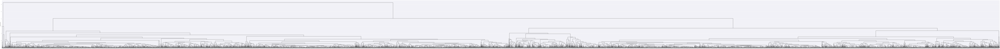

In [62]:
from scipy.cluster.hierarchy import dendrogram
# make dendrogram black (part 1/2)
from scipy.cluster.hierarchy import set_link_color_palette
set_link_color_palette(['black'])
plt.figure(figsize = (300,15))
row_dendr = dendrogram(row_clusters, 
                      labels=numeric_data.index.tolist(),
                      # make dendrogram black (part 2/2)
                      color_threshold=np.inf
                      )
plt.tight_layout()
plt.ylabel('Euclidean distance')
plt.show()

More detailed implementations are done in Orange.